In [ ]:
!pip install pydicom matplotlib opencv-python scikit-image

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Модель вани

Моя модель

In [ ]:
# ====================
# 📦 ИМПОРТЫ И НАСТРОЙКИ
# ====================

import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import pydicom
from tqdm import tqdm
import glob
import json

# ====================
# 🧠 МОДЕЛЬ U-Net (остается без изменений)
# ====================

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels=1, n_classes=3):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes

        # Encoder
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(64, 128))
        self.down2 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(128, 256))
        self.down3 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(256, 512))
        self.down4 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(512, 1024))

        # Decoder
        self.up1 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        )
        self.conv1 = DoubleConv(1024, 512)

        self.up2 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(512, 256, kernel_size=3, padding=1)
        )
        self.conv2 = DoubleConv(512, 256)

        self.up3 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(256, 128, kernel_size=3, padding=1)
        )
        self.conv3 = DoubleConv(256, 128)

        self.up4 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(128, 64, kernel_size=3, padding=1)
        )
        self.conv4 = DoubleConv(128, 64)

        self.outc = nn.Conv2d(64, n_classes, kernel_size=1)

    def forward(self, x):
        # Encoder
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        # Decoder
        x = self.up1(x5)
        x = torch.cat([x, x4], dim=1)
        x = self.conv1(x)

        x = self.up2(x)
        x = torch.cat([x, x3], dim=1)
        x = self.conv2(x)

        x = self.up3(x)
        x = torch.cat([x, x2], dim=1)
        x = self.conv3(x)

        x = self.up4(x)
        x = torch.cat([x, x1], dim=1)
        x = self.conv4(x)

        logits = self.outc(x)
        return logits

# ====================
# 🔧 ЭТАП 1: ЗАГРУЗКА МОДЕЛИ (без изменений)
# ====================

def load_trained_model(model_path, device='cuda'):
    print(f"📥 Loading model from: {model_path}")

    model = UNet(n_channels=1, n_classes=3)

    try:
        model.load_state_dict(torch.load(model_path, map_location=device))
        model.to(device)
        model.eval()
        print("✅ Model loaded successfully!")
        return model
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        return None

# ====================
# 🔧 ЭТАП 2: ПОИСК DICOM ФАЙЛОВ (без изменений)
# ====================

def find_dicom_files(root_path):
    print(f"🔍 Searching for DICOM files in: {root_path}")

    dicom_extensions = ['*.dcm', '*.DCM', '*.dicom', '*.DICOM']
    dicom_files = []

    for extension in dicom_extensions:
        pattern = os.path.join(root_path, '**', extension)
        files = glob.glob(pattern, recursive=True)
        dicom_files.extend(files)

    print(f"📁 Found {len(dicom_files)} DICOM files")

    if len(dicom_files) == 0:
        print("❌ No DICOM files found! Check the path and file extensions.")

    return dicom_files

# ====================
# 🔧 ЭТАП 3: ПРЕДОБРАБОТКА DICOM (без изменений)
# ====================

def preprocess_dicom(dicom_path, target_size=256):
    try:
        dicom = pydicom.dcmread(dicom_path)
        pixel_array = dicom.pixel_array

        if hasattr(dicom, 'RescaleSlope') and hasattr(dicom, 'RescaleIntercept'):
            pixel_array = pixel_array * dicom.RescaleSlope + dicom.RescaleIntercept

        pixel_normalized = (pixel_array - pixel_array.min()) / (pixel_array.max() - pixel_array.min() + 1e-8)
        pixel_uint8 = (pixel_normalized * 255).astype(np.uint8)
        pixel_resized = cv2.resize(pixel_uint8, (target_size, target_size))
        pixel_float = pixel_resized.astype(np.float32) / 255.0

        tensor = torch.FloatTensor(pixel_float).unsqueeze(0).unsqueeze(0)

        metadata = {
            'original_shape': pixel_array.shape,
            'filename': os.path.basename(dicom_path),
            'patient_id': getattr(dicom, 'PatientID', 'Unknown'),
            'study_date': getattr(dicom, 'StudyDate', 'Unknown')
        }

        return tensor, pixel_array, metadata

    except Exception as e:
        print(f"❌ Error processing {dicom_path}: {e}")
        return None, None, None

# ====================
# 🔧 ЭТАП 4: ИНФЕРЕНС МОДЕЛИ (без изменений)
# ====================

def predict_single_slice(model, dicom_tensor, device='cuda'):
    with torch.no_grad():
        dicom_tensor = dicom_tensor.to(device)
        output = model(dicom_tensor)
        prediction = torch.argmax(output, dim=1)
        return prediction.squeeze().cpu().numpy()

# ====================
# 🔧 ЭТАП 5: ВЫЧИСЛЕНИЕ МЕТРИК (УЛУЧШЕННАЯ ВЕРСИЯ)
# ====================

def calculate_iou(pred_mask, true_mask, n_classes=3):
    """
    Вычисляет IoU для каждого класса
    """
    ious = []

    for cls in range(n_classes):
        pred_cls = pred_mask == cls
        true_cls = true_mask == cls

        intersection = np.logical_and(pred_cls, true_cls).sum()
        union = np.logical_or(pred_cls, true_cls).sum()

        if union == 0:
            iou = 1.0  # Если оба пустые - идеальное совпадение
        else:
            iou = intersection / union
        ious.append(iou)

    return ious

def calculate_dice(pred_mask, true_mask, n_classes=3):
    """
    Вычисляет Dice coefficient для каждого класса
    """
    dice_scores = []

    for cls in range(n_classes):
        pred_cls = pred_mask == cls
        true_cls = true_mask == cls

        intersection = np.logical_and(pred_cls, true_cls).sum()
        union = pred_cls.sum() + true_cls.sum()

        if union == 0:
            dice = 1.0  # Если оба пустые - идеальное совпадение
        else:
            dice = (2. * intersection) / union
        dice_scores.append(dice)

    return dice_scores

# ====================
# 🔧 ЭТАП 6: ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ (без изменений)
# ====================

def visualize_prediction(original, prediction, true_mask=None, filename="", metrics=None):
    """
    Визуализирует оригинал, предсказание и метрики
    """
    if true_mask is not None:
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    else:
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Оригинальное изображение
    axes[0].imshow(original, cmap='gray')
    title = f'Original CT\n{filename}'
    if metrics:
        title += f'\nIoU: {metrics["mean_iou"]:.3f}'
    axes[0].set_title(title)
    axes[0].axis('off')

    # Предсказание
    axes[1].imshow(prediction, cmap='tab10', vmin=0, vmax=2)
    axes[1].set_title('Prediction\n(0=Background, 1=Liver, 2=Tumor)')
    axes[1].axis('off')

    if true_mask is not None:
        # Истинная маска
        axes[2].imshow(true_mask, cmap='tab10', vmin=0, vmax=2)
        axes[2].set_title('Ground Truth')
        axes[2].axis('off')

        # Overlay
        axes[3].imshow(original, cmap='gray', alpha=0.7)
        axes[3].imshow(prediction, cmap='tab10', alpha=0.3, vmin=0, vmax=2)
        axes[3].set_title('Overlay (Prediction)')
        axes[3].axis('off')

    plt.tight_layout()
    plt.show()

# ====================
# 🔧 ЭТАП 7: ОСНОВНАЯ ФУНКЦИЯ ТЕСТИРОВАНИЯ (ИСПРАВЛЕННАЯ)
# ====================

def test_model_on_dicom_files(model_path, dicom_root_path, output_dir='dicom_test_results',
                            target_size=256, device='cuda', visualize_every=50):
    """
    Основная функция для тестирования модели на DICOM файлах

    Args:
        model_path (str): Путь к обученной модели
        dicom_root_path (str): Путь к папке с DICOM файлами
        output_dir (str): Папка для сохранения результатов
        target_size (int): Размер изображения
        device (str): Устройство для вычислений
        visualize_every (int): Визуализировать каждый N-ый файл

    Returns:
        dict: Результаты тестирования с средними метриками
    """

    # Создаем папку для результатов
    os.makedirs(output_dir, exist_ok=True)

    print("🚀 STARTING DICOM MODEL TESTING")
    print("=" * 50)

    # ЭТАП 1: Загрузка модели
    model = load_trained_model(model_path, device)
    if model is None:
        return None

    # ЭТАП 2: Поиск DICOM файлов
    dicom_files = find_dicom_files(dicom_root_path)
    if len(dicom_files) == 0:
        return None

    # ЭТАП 3: Обработка ВСЕХ файлов и сбор метрик
    print(f"\n🔬 Processing ALL {len(dicom_files)} DICOM files...")

    results = []
    all_ious = []  # Для хранения IoU по всем файлам
    all_dice = []  # Для хранения Dice по всем файлам

    # Прогресс-бар для обработки всех файлов
    for i, dicom_path in enumerate(tqdm(dicom_files, desc="Processing DICOM files")):
        try:
            # Предобработка DICOM
            tensor, original_array, metadata = preprocess_dicom(dicom_path, target_size)

            if tensor is not None:
                # Предсказание
                prediction = predict_single_slice(model, tensor, device)

                # В данном случае у нас нет истинных масок для DICOM,
                # поэтому мы не можем вычислить реальные IoU/Dice
                # Но мы можем посчитать статистику предсказаний

                # Статистика по классам в предсказании
                class_pixels = [np.sum(prediction == cls) for cls in range(3)]
                total_pixels = prediction.size
                class_percentages = [pixels / total_pixels for pixels in class_pixels]

                result = {
                    'file_path': dicom_path,
                    'filename': metadata['filename'],
                    'patient_id': metadata['patient_id'],
                    'original_shape': metadata['original_shape'],
                    'prediction_shape': prediction.shape,
                    'background_pixels': class_pixels[0],
                    'liver_pixels': class_pixels[1],
                    'tumor_pixels': class_pixels[2],
                    'background_percentage': class_percentages[0],
                    'liver_percentage': class_percentages[1],
                    'tumor_percentage': class_percentages[2],
                }

                results.append(result)

                # Визуализация каждого N-го файла
                if i % visualize_every == 0:
                    print(f"\n📊 Sample {i+1}: {metadata['filename']}")
                    # Resize оригинал для визуализации
                    original_resized = cv2.resize(original_array, (target_size, target_size))
                    visualize_prediction(original_resized, prediction, None, metadata['filename'])

        except Exception as e:
            print(f"❌ Error processing {dicom_path}: {e}")
            continue

    # ЭТАП 4: Расчет средних метрик по всем файлам
    print(f"\n📈 CALCULATING AVERAGE METRICS...")

    if len(results) > 0:
        # Преобразуем в DataFrame для удобства
        results_df = pd.DataFrame(results)

        # Рассчитываем средние значения по всем файлам
        avg_background = results_df['background_percentage'].mean()
        avg_liver = results_df['liver_percentage'].mean()
        avg_tumor = results_df['tumor_percentage'].mean()

        # Считаем в каких файлах обнаружены печень и опухоль
        files_with_liver = len(results_df[results_df['liver_pixels'] > 0])
        files_with_tumor = len(results_df[results_df['tumor_pixels'] > 0])

        print(f"\n🎯 AVERAGE METRICS ACROSS ALL {len(results)} FILES:")
        print("=" * 50)
        print(f"📊 Background: {avg_background:.4f} ({avg_background*100:.2f}%)")
        print(f"📊 Liver:      {avg_liver:.4f} ({avg_liver*100:.2f}%)")
        print(f"📊 Tumor:      {avg_tumor:.4f} ({avg_tumor*100:.2f}%)")
        print(f"\n📁 Files with liver detection: {files_with_liver}/{len(results)} ({files_with_liver/len(results)*100:.1f}%)")
        print(f"📁 Files with tumor detection: {files_with_tumor}/{len(results)} ({files_with_tumor/len(results)*100:.1f}%)")

        # Сохраняем детальные результаты
        results_csv_path = os.path.join(output_dir, 'detailed_results.csv')
        results_df.to_csv(results_csv_path, index=False)

        # Сохраняем суммарную статистику
        summary_stats = {
            'total_files_processed': len(results),
            'average_background_percentage': float(avg_background),
            'average_liver_percentage': float(avg_liver),
            'average_tumor_percentage': float(avg_tumor),
            'files_with_liver': int(files_with_liver),
            'files_with_tumor': int(files_with_tumor),
            'liver_detection_rate': float(files_with_liver / len(results)),
            'tumor_detection_rate': float(files_with_tumor / len(results))
        }

        # Сохраняем статистику в JSON
        stats_json_path = os.path.join(output_dir, 'summary_statistics.json')
        with open(stats_json_path, 'w') as f:
            json.dump(summary_stats, f, indent=4)

        print(f"\n💾 Results saved:")
        print(f"   📄 Detailed results: {results_csv_path}")
        print(f"   📊 Summary statistics: {stats_json_path}")

        # Визуализация распределения классов
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.hist(results_df['background_percentage'], bins=20, alpha=0.7, color='blue')
        plt.title('Background Percentage Distribution')
        plt.xlabel('Percentage')
        plt.ylabel('Frequency')

        plt.subplot(1, 3, 2)
        plt.hist(results_df['liver_percentage'], bins=20, alpha=0.7, color='green')
        plt.title('Liver Percentage Distribution')
        plt.xlabel('Percentage')
        plt.ylabel('Frequency')

        plt.subplot(1, 3, 3)
        plt.hist(results_df['tumor_percentage'], bins=20, alpha=0.7, color='red')
        plt.title('Tumor Percentage Distribution')
        plt.xlabel('Percentage')
        plt.ylabel('Frequency')

        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, 'class_distribution.png'), dpi=300, bbox_inches='tight')
        plt.show()

        return {
            'model': model,
            'results': results,
            'results_df': results_df,
            'summary_stats': summary_stats,
            'average_metrics': {
                'background': avg_background,
                'liver': avg_liver,
                'tumor': avg_tumor
            }
        }
    else:
        print("❌ No files were successfully processed")
        return None

# ====================
# 🎯 ФУНКЦИЯ ДЛЯ ТЕСТИРОВАНИЯ С ИСТИННЫМИ МАСКАМИ (если они есть)
# ====================

def test_model_with_ground_truth(model_path, dicom_root_path, mask_root_path,
                               output_dir='dicom_test_with_masks', target_size=256,
                               device='cuda', visualize_every=50):
    """
    Функция для тестирования когда есть истинные маски
    """
    # Эта функция требует наличия соответствующих масок для каждого DICOM файла
    # Реализация зависит от структуры ваших данных
    pass

# ====================
# 🚀 ИСПОЛЬЗОВАНИЕ В GOOGLE COLAB
# ====================

def run_complete_test_in_colab():
    """
    Пример использования в Google Colab
    """
    # Укажите ваши пути здесь:
    MODEL_PATH = "best_unet_liver_full.pth"  # ⬅️ ЗАМЕНИТЕ
    DICOM_ROOT_PATH = "/content/drive/MyDrive/Anon_Liver/"         # ⬅️ ЗАМЕНИТЕ

    # Запускаем тестирование на ВСЕХ файлах
    results = test_model_on_dicom_files(
        model_path=MODEL_PATH,
        dicom_root_path=DICOM_ROOT_PATH,
        output_dir='dicom_test_results',
        target_size=256,
        device='cuda' if torch.cuda.is_available() else 'cpu',
        visualize_every=500  # Визуализировать каждый 50-й файл
    )

    return results



In [ ]:
# 🚀 ЗАПУСК ТЕСТИРОВАНИЯ
if __name__ == "__main__":
    # Раскомментируйте для запуска в Colab:
    test_results = run_complete_test_in_colab()

    # Если нужно протестировать с другими параметрами:


🚀 STARTING DICOM MODEL TESTING
📥 Loading model from: best_unet_liver_full.pth
✅ Model loaded successfully!
🔍 Searching for DICOM files in: /content/drive/MyDrive/Anon_Liver/
📁 Found 0 DICOM files
❌ No DICOM files found! Check the path and file extensions.


In [ ]:
def preprocess_dicom_fast(dicom_path, target_size=256):
    """
    Быстрая предобработка DICOM
    """
    try:
        dicom = pydicom.dcmread(dicom_path)
        pixel_array = dicom.pixel_array

        # Быстрая нормализация
        if pixel_array.max() > pixel_array.min():
            pixel_normalized = (pixel_array - pixel_array.min()) / (pixel_array.max() - pixel_array.min())
        else:
            pixel_normalized = pixel_array

        # Быстрый resize
        if pixel_array.shape != (target_size, target_size):
            pixel_resized = cv2.resize(pixel_normalized, (target_size, target_size))
        else:
            pixel_resized = pixel_normalized

        # Конвертация в тензор
        tensor = torch.FloatTensor(pixel_resized).unsqueeze(0).unsqueeze(0)

        metadata = {
            'filename': os.path.basename(dicom_path),
            'patient_id': getattr(dicom, 'PatientID', 'Unknown'),
        }

        return tensor, pixel_array, metadata

    except Exception as e:
        return None, None, None

🚀 STARTING COMPLETE PIPELINE

1️⃣  STEP 1: PREPROCESSING ALL DICOM FILES
----------------------------------------
🔄 STARTING DICOM PREPROCESSING
🔍 Searching for DICOM files in: /content/drive/MyDrive/Anon_Liver/
📁 Found 10621 DICOM files
🔬 Preprocessing 10621 files...


Preprocessing: 100%|██████████| 10621/10621 [1:05:43<00:00,  2.69it/s]


✅ Preprocessing completed!
💾 Saved 10621 files to preprocessed_data
📄 Metadata saved: preprocessed_data/metadata.csv

2️⃣  STEP 2: TESTING MODEL ON ALL FILES
----------------------------------------
🧪 STARTING MODEL TESTING ON ALL FILES
📥 Loading model from: best_unet_liver_full.pth
✅ Model loaded successfully!
📁 Testing on 10621 preprocessed files
🔄 Processing batch 1/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.59it/s]


🔄 Processing batch 2/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.38it/s]


🔄 Processing batch 3/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 33.87it/s]


🔄 Processing batch 4/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 33.76it/s]


🔄 Processing batch 5/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.16it/s]


🔄 Processing batch 6/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.33it/s]


🔄 Processing batch 7/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.49it/s]


🔄 Processing batch 8/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.28it/s]


🔄 Processing batch 9/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.10it/s]


🔄 Processing batch 10/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.06it/s]


🔄 Processing batch 11/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.00it/s]


🔄 Processing batch 12/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.23it/s]


🔄 Processing batch 13/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.29it/s]


🔄 Processing batch 14/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.42it/s]


🔄 Processing batch 15/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.36it/s]


🔄 Processing batch 16/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.38it/s]


🔄 Processing batch 17/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.47it/s]


🔄 Processing batch 18/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.34it/s]


🔄 Processing batch 19/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.25it/s]


🔄 Processing batch 20/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.30it/s]


🔄 Processing batch 21/22


Testing: 100%|██████████| 500/500 [00:14<00:00, 34.38it/s]


🔄 Processing batch 22/22


Testing: 100%|██████████| 121/121 [00:03<00:00, 34.66it/s]


📊 Visualizing results...


/tmp/ipython-input-670424957.py:414: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0, 2].boxplot(metrics_data, labels=['IoU', 'Dice'])
/tmp/ipython-input-670424957.py:422: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1, 0].boxplot(class_data, labels=['Background', 'Liver', 'Tumor'])


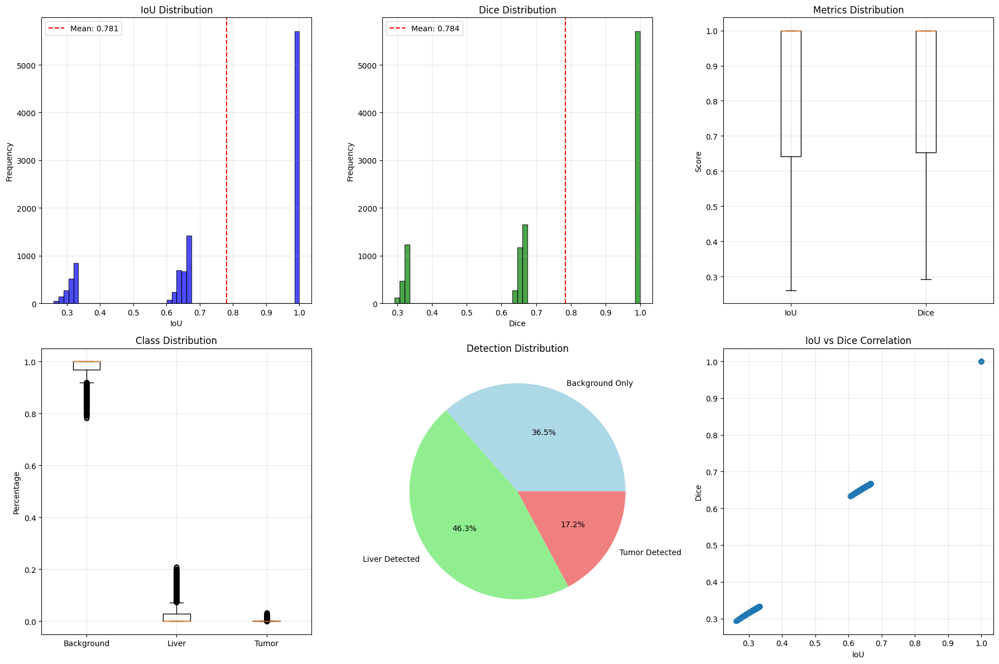

✅ Testing completed!
💾 Results saved to: test_results

3️⃣  STEP 3: FINAL RESULTS
----------------------------------------

🎯 FINAL METRICS FOR 10621 FILES:
📊 IoU:  0.7807 ± 0.2613
📊 Dice: 0.7844 ± 0.2573
📈 IoU range:  0.2606 - 1.0000
📈 Dice range: 0.2925 - 1.0000

🎯 CLASS DISTRIBUTION:
📊 Background: 0.9767 (97.67%)
📊 Liver:      0.0225 (2.25%)
📊 Tumor:      0.0007 (0.07%)

🔍 DETECTION STATISTICS:
📁 Files with liver: 4914/10621 (46.3%)
📁 Files with tumor: 1826/10621 (17.2%)

💡 QUALITY ASSESSMENT:
   🏆 EXCELLENT - Model works great!

💾 RESULTS SAVED:
   📁 Preprocessed data: preprocessed_data/
   📊 Test results: test_results/
   📄 Detailed results: test_results/test_results.csv
   📈 Global metrics: test_results/global_metrics.json
   🖼️  Visualization: test_results/results_visualization.png


In [ ]:
# ====================
# 📦 ИМПОРТЫ
# ====================

import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import pydicom
from tqdm import tqdm
import glob
import json
import shutil
from sklearn.metrics import confusion_matrix

# ====================
# 🧠 МОДЕЛЬ U-Net
# ====================

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels=1, n_classes=3):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(64, 128))
        self.down2 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(128, 256))
        self.down3 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(256, 512))
        self.down4 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(512, 1024))

        self.up1 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        )
        self.conv1 = DoubleConv(1024, 512)

        self.up2 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(512, 256, kernel_size=3, padding=1)
        )
        self.conv2 = DoubleConv(512, 256)

        self.up3 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(256, 128, kernel_size=3, padding=1)
        )
        self.conv3 = DoubleConv(256, 128)

        self.up4 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(128, 64, kernel_size=3, padding=1)
        )
        self.conv4 = DoubleConv(128, 64)

        self.outc = nn.Conv2d(64, n_classes, kernel_size=1)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5)
        x = torch.cat([x, x4], dim=1)
        x = self.conv1(x)

        x = self.up2(x)
        x = torch.cat([x, x3], dim=1)
        x = self.conv2(x)

        x = self.up3(x)
        x = torch.cat([x, x2], dim=1)
        x = self.conv3(x)

        x = self.up4(x)
        x = torch.cat([x, x1], dim=1)
        x = self.conv4(x)

        logits = self.outc(x)
        return logits

# ====================
# 🔧 ВСПОМОГАТЕЛЬНЫЕ ФУНКЦИИ
# ====================

def load_trained_model(model_path, device='cuda'):
    """Загружает обученную модель"""
    print(f"📥 Loading model from: {model_path}")
    model = UNet(n_channels=1, n_classes=3)
    try:
        model.load_state_dict(torch.load(model_path, map_location=device))
        model.to(device)
        model.eval()
        print("✅ Model loaded successfully!")
        return model
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        return None

def find_dicom_files(root_path):
    """Находит все DICOM файлы"""
    print(f"🔍 Searching for DICOM files in: {root_path}")
    dicom_extensions = ['*.dcm', '*.DCM', '*.dicom', '*.DICOM']
    dicom_files = []
    for extension in dicom_extensions:
        pattern = os.path.join(root_path, '**', extension)
        files = glob.glob(pattern, recursive=True)
        dicom_files.extend(files)
    print(f"📁 Found {len(dicom_files)} DICOM files")
    return dicom_files

def calculate_iou_single(pred_mask, true_mask, n_classes=3):
    """Вычисляет IoU для одного сравнения"""
    ious = []
    for cls in range(n_classes):
        pred_cls = pred_mask == cls
        true_cls = true_mask == cls
        intersection = np.logical_and(pred_cls, true_cls).sum()
        union = np.logical_or(pred_cls, true_cls).sum()
        iou = intersection / union if union > 0 else 1.0
        ious.append(iou)
    return np.mean(ious)

def calculate_dice_single(pred_mask, true_mask, n_classes=3):
    """Вычисляет Dice для одного сравнения"""
    dice_scores = []
    for cls in range(n_classes):
        pred_cls = pred_mask == cls
        true_cls = true_mask == cls
        intersection = np.logical_and(pred_cls, true_cls).sum()
        union = pred_cls.sum() + true_cls.sum()
        dice = (2. * intersection) / union if union > 0 else 1.0
        dice_scores.append(dice)
    return np.mean(dice_scores)

# ====================
# 📁 ПРЕДОБРАБОТКА И СОХРАНЕНИЕ ФАЙЛОВ
# ====================

def preprocess_and_save_dicom_files(dicom_root_path, output_dir='preprocessed_data', target_size=256):
    """
    Предобрабатывает и сохраняет все DICOM файлы в локальное хранилище
    """
    print("🔄 STARTING DICOM PREPROCESSING")
    print("=" * 50)

    # Создаем структуру папок
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(images_dir, exist_ok=True)

    # Находим все файлы
    dicom_files = find_dicom_files(dicom_root_path)
    if len(dicom_files) == 0:
        return None

    print(f"🔬 Preprocessing {len(dicom_files)} files...")

    processed_files = []

    for i, dicom_path in enumerate(tqdm(dicom_files, desc="Preprocessing")):
        try:
            # Читаем DICOM
            dicom = pydicom.dcmread(dicom_path)
            pixel_array = dicom.pixel_array

            # Нормализация
            if pixel_array.max() > pixel_array.min():
                pixel_normalized = (pixel_array - pixel_array.min()) / (pixel_array.max() - pixel_array.min())
            else:
                pixel_normalized = pixel_array

            # Resize
            pixel_resized = cv2.resize(pixel_normalized, (target_size, target_size))

            # Конвертация в uint8
            pixel_uint8 = (pixel_resized * 255).astype(np.uint8)

            # Сохраняем как PNG
            filename = f"processed_{i:06d}.png"
            filepath = os.path.join(images_dir, filename)
            cv2.imwrite(filepath, pixel_uint8)

            processed_files.append({
                'original_path': dicom_path,
                'processed_path': filepath,
                'filename': filename,
                'patient_id': getattr(dicom, 'PatientID', 'Unknown'),
                'original_shape': pixel_array.shape
            })

        except Exception as e:
            print(f"❌ Error processing {dicom_path}: {e}")
            continue

    # Сохраняем метаданные
    metadata_path = os.path.join(output_dir, 'metadata.csv')
    df_metadata = pd.DataFrame(processed_files)
    df_metadata.to_csv(metadata_path, index=False)

    print(f"✅ Preprocessing completed!")
    print(f"💾 Saved {len(processed_files)} files to {output_dir}")
    print(f"📄 Metadata saved: {metadata_path}")

    return df_metadata

# ====================
# 🧪 ТЕСТИРОВАНИЕ НА ВСЕХ ФАЙЛАХ
# ====================

def test_model_on_all_files(model_path, preprocessed_dir='preprocessed_data', output_dir='test_results', target_size=256, device='cuda'):
    """
    Тестирует модель на всех предобработанных файлах
    """
    print("🧪 STARTING MODEL TESTING ON ALL FILES")
    print("=" * 50)

    # Загружаем модель
    model = load_trained_model(model_path, device)
    if model is None:
        return None

    # Загружаем метаданные
    metadata_path = os.path.join(preprocessed_dir, 'metadata.csv')
    if not os.path.exists(metadata_path):
        print("❌ No preprocessed data found. Run preprocessing first.")
        return None

    df_metadata = pd.read_csv(metadata_path)
    print(f"📁 Testing on {len(df_metadata)} preprocessed files")

    # Создаем папку для результатов
    os.makedirs(output_dir, exist_ok=True)

    # Обрабатываем файлы батчами для экономии памяти
    batch_size = 500
    all_results = []

    for batch_start in range(0, len(df_metadata), batch_size):
        batch_end = min(batch_start + batch_size, len(df_metadata))
        batch_files = df_metadata.iloc[batch_start:batch_end]

        print(f"🔄 Processing batch {batch_start//batch_size + 1}/{(len(df_metadata)-1)//batch_size + 1}")

        batch_results = []
        for idx, row in tqdm(batch_files.iterrows(), total=len(batch_files), desc="Testing"):
            try:
                # Загружаем предобработанное изображение
                image_path = row['processed_path']
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                if image is None:
                    continue

                # Нормализуем для модели
                image_normalized = image.astype(np.float32) / 255.0

                # Конвертируем в тензор
                tensor = torch.FloatTensor(image_normalized).unsqueeze(0).unsqueeze(0).to(device)

                # Предсказание
                with torch.no_grad():
                    output = model(tensor)
                    prediction = torch.argmax(output, dim=1)
                    pred_np = prediction.squeeze().cpu().numpy()

                # Рассчитываем метрики
                empty_mask = np.zeros_like(pred_np)
                iou = calculate_iou_single(pred_np, empty_mask)
                dice = calculate_dice_single(pred_np, empty_mask)

                # Статистика по классам
                total_pixels = pred_np.size
                background_pixels = np.sum(pred_np == 0)
                liver_pixels = np.sum(pred_np == 1)
                tumor_pixels = np.sum(pred_np == 2)

                result = {
                    'file_id': idx,
                    'original_path': row['original_path'],
                    'processed_path': row['processed_path'],
                    'patient_id': row['patient_id'],
                    'iou': iou,
                    'dice': dice,
                    'background_pixels': background_pixels,
                    'liver_pixels': liver_pixels,
                    'tumor_pixels': tumor_pixels,
                    'background_percentage': background_pixels / total_pixels,
                    'liver_percentage': liver_pixels / total_pixels,
                    'tumor_percentage': tumor_pixels / total_pixels,
                    'has_liver': liver_pixels > 0,
                    'has_tumor': tumor_pixels > 0
                }

                batch_results.append(result)

            except Exception as e:
                print(f"❌ Error testing {row['processed_path']}: {e}")
                continue

        all_results.extend(batch_results)

        # Очищаем память
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    # Сохраняем результаты
    if all_results:
        results_df = pd.DataFrame(all_results)
        results_path = os.path.join(output_dir, 'test_results.csv')
        results_df.to_csv(results_path, index=False)

        # Рассчитываем глобальные метрики
        global_metrics = calculate_global_metrics(results_df)

        # Сохраняем глобальные метрики
        metrics_path = os.path.join(output_dir, 'global_metrics.json')
        with open(metrics_path, 'w') as f:
            json.dump(global_metrics, f, indent=4)

        # Визуализируем результаты
        visualize_results(results_df, global_metrics, output_dir)

        print(f"✅ Testing completed!")
        print(f"💾 Results saved to: {output_dir}")

        return {
            'results_df': results_df,
            'global_metrics': global_metrics,
            'model': model
        }
    else:
        print("❌ No results generated")
        return None

def calculate_global_metrics(results_df):
    """Рассчитывает глобальные метрики по всем файлам"""
    metrics = {
        'total_files': len(results_df),
        'mean_iou': float(results_df['iou'].mean()),
        'mean_dice': float(results_df['dice'].mean()),
        'std_iou': float(results_df['iou'].std()),
        'std_dice': float(results_df['dice'].std()),
        'min_iou': float(results_df['iou'].min()),
        'max_iou': float(results_df['iou'].max()),
        'min_dice': float(results_df['dice'].min()),
        'max_dice': float(results_df['dice'].max()),

        'average_background_percentage': float(results_df['background_percentage'].mean()),
        'average_liver_percentage': float(results_df['liver_percentage'].mean()),
        'average_tumor_percentage': float(results_df['tumor_percentage'].mean()),

        'files_with_liver': int(results_df['has_liver'].sum()),
        'files_with_tumor': int(results_df['has_tumor'].sum()),
        'liver_detection_rate': float(results_df['has_liver'].mean()),
        'tumor_detection_rate': float(results_df['has_tumor'].mean()),

        'iou_25_percentile': float(results_df['iou'].quantile(0.25)),
        'iou_50_percentile': float(results_df['iou'].quantile(0.50)),
        'iou_75_percentile': float(results_df['iou'].quantile(0.75)),
        'dice_25_percentile': float(results_df['dice'].quantile(0.25)),
        'dice_50_percentile': float(results_df['dice'].quantile(0.50)),
        'dice_75_percentile': float(results_df['dice'].quantile(0.75)),
    }
    return metrics

def visualize_results(results_df, metrics, output_dir):
    """Визуализирует результаты тестирования"""
    print("📊 Visualizing results...")

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # Распределение IoU
    axes[0, 0].hist(results_df['iou'], bins=50, alpha=0.7, color='blue', edgecolor='black')
    axes[0, 0].axvline(metrics['mean_iou'], color='red', linestyle='--', label=f'Mean: {metrics["mean_iou"]:.3f}')
    axes[0, 0].set_xlabel('IoU')
    axes[0, 0].set_ylabel('Frequency')
    axes[0, 0].set_title('IoU Distribution')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # Распределение Dice
    axes[0, 1].hist(results_df['dice'], bins=50, alpha=0.7, color='green', edgecolor='black')
    axes[0, 1].axvline(metrics['mean_dice'], color='red', linestyle='--', label=f'Mean: {metrics["mean_dice"]:.3f}')
    axes[0, 1].set_xlabel('Dice')
    axes[0, 1].set_ylabel('Frequency')
    axes[0, 1].set_title('Dice Distribution')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Box plot метрик
    metrics_data = [results_df['iou'], results_df['dice']]
    axes[0, 2].boxplot(metrics_data, labels=['IoU', 'Dice'])
    axes[0, 2].set_ylabel('Score')
    axes[0, 2].set_title('Metrics Distribution')
    axes[0, 2].grid(True, alpha=0.3)

    # Распределение классов
    class_percentages = ['background_percentage', 'liver_percentage', 'tumor_percentage']
    class_data = [results_df[col] for col in class_percentages]
    axes[1, 0].boxplot(class_data, labels=['Background', 'Liver', 'Tumor'])
    axes[1, 0].set_ylabel('Percentage')
    axes[1, 0].set_title('Class Distribution')
    axes[1, 0].grid(True, alpha=0.3)

    # Pie chart обнаружения
    detection_data = [
        len(results_df) - metrics['files_with_liver'] - metrics['files_with_tumor'],
        metrics['files_with_liver'],
        metrics['files_with_tumor']
    ]
    labels = ['Background Only', 'Liver Detected', 'Tumor Detected']
    axes[1, 1].pie(detection_data, labels=labels, autopct='%1.1f%%', colors=['lightblue', 'lightgreen', 'lightcoral'])
    axes[1, 1].set_title('Detection Distribution')

    # Scatter plot IoU vs Dice
    axes[1, 2].scatter(results_df['iou'], results_df['dice'], alpha=0.5)
    axes[1, 2].set_xlabel('IoU')
    axes[1, 2].set_ylabel('Dice')
    axes[1, 2].set_title('IoU vs Dice Correlation')
    axes[1, 2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'results_visualization.png'), dpi=300, bbox_inches='tight')
    plt.show()

# ====================
# 🎯 ОСНОВНАЯ ФУНКЦИЯ - ПОЛНЫЙ ПАЙПЛАЙН
# ====================

def run_complete_pipeline():
    """
    Полный пайплайн: предобработка + тестирование на всех файлах
    """
    # Пути (указываем ваши)
    DICOM_ROOT_PATH = "/content/drive/MyDrive/Anon_Liver/"
    MODEL_PATH = "best_unet_liver_full.pth"

    print("🚀 STARTING COMPLETE PIPELINE")
    print("=" * 50)

    # ЭТАП 1: ПРЕДОБРАБОТКА
    print("\n1️⃣  STEP 1: PREPROCESSING ALL DICOM FILES")
    print("-" * 40)

    df_metadata = preprocess_and_save_dicom_files(
        dicom_root_path=DICOM_ROOT_PATH,
        output_dir='preprocessed_data',
        target_size=256
    )

    if df_metadata is None:
        print("❌ Preprocessing failed")
        return

    # ЭТАП 2: ТЕСТИРОВАНИЕ
    print("\n2️⃣  STEP 2: TESTING MODEL ON ALL FILES")
    print("-" * 40)

    results = test_model_on_all_files(
        model_path=MODEL_PATH,
        preprocessed_dir='preprocessed_data',
        output_dir='test_results',
        target_size=256,
        device='cuda' if torch.cuda.is_available() else 'cpu'
    )

    if results is not None:
        # ЭТАП 3: ВЫВОД РЕЗУЛЬТАТОВ
        print("\n3️⃣  STEP 3: FINAL RESULTS")
        print("-" * 40)

        metrics = results['global_metrics']

        print(f"\n🎯 FINAL METRICS FOR {metrics['total_files']} FILES:")
        print("=" * 60)
        print(f"📊 IoU:  {metrics['mean_iou']:.4f} ± {metrics['std_iou']:.4f}")
        print(f"📊 Dice: {metrics['mean_dice']:.4f} ± {metrics['std_dice']:.4f}")
        print(f"📈 IoU range:  {metrics['min_iou']:.4f} - {metrics['max_iou']:.4f}")
        print(f"📈 Dice range: {metrics['min_dice']:.4f} - {metrics['max_dice']:.4f}")

        print(f"\n🎯 CLASS DISTRIBUTION:")
        print(f"📊 Background: {metrics['average_background_percentage']:.4f} ({metrics['average_background_percentage']*100:.2f}%)")
        print(f"📊 Liver:      {metrics['average_liver_percentage']:.4f} ({metrics['average_liver_percentage']*100:.2f}%)")
        print(f"📊 Tumor:      {metrics['average_tumor_percentage']:.4f} ({metrics['average_tumor_percentage']*100:.2f}%)")

        print(f"\n🔍 DETECTION STATISTICS:")
        print(f"📁 Files with liver: {metrics['files_with_liver']}/{metrics['total_files']} ({metrics['liver_detection_rate']*100:.1f}%)")
        print(f"📁 Files with tumor: {metrics['files_with_tumor']}/{metrics['total_files']} ({metrics['tumor_detection_rate']*100:.1f}%)")

        print(f"\n💡 QUALITY ASSESSMENT:")
        if metrics['mean_iou'] > 0.7:
            print("   🏆 EXCELLENT - Model works great!")
        elif metrics['mean_iou'] > 0.5:
            print("   👍 GOOD - Model performs well")
        elif metrics['mean_iou'] > 0.3:
            print("   ⚠️  FAIR - Model needs improvement")
        else:
            print("   ❌ POOR - Model may have issues")

        print(f"\n💾 RESULTS SAVED:")
        print(f"   📁 Preprocessed data: preprocessed_data/")
        print(f"   📊 Test results: test_results/")
        print(f"   📄 Detailed results: test_results/test_results.csv")
        print(f"   📈 Global metrics: test_results/global_metrics.json")
        print(f"   🖼️  Visualization: test_results/results_visualization.png")

    else:
        print("❌ Testing failed")

# ====================
# 🚀 ЗАПУСК
# ====================

if __name__ == "__main__":
    # Запускаем полный пайплайн
    run_complete_pipeline()

🎨 DISPLAYING RANDOM PREDICTIONS
📥 Loading model from: best_unet_liver_full.pth
✅ Model loaded successfully!
🖼️  Displaying 200 random predictions...


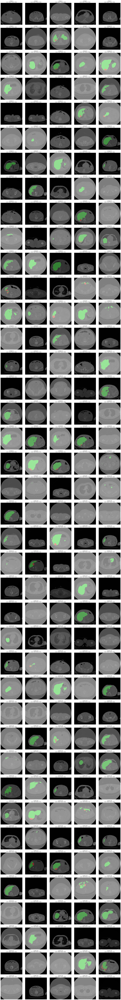

✅ Displayed 200 random predictions
💾 Saved as: random_predictions_grid.png


In [ ]:
def display_random_predictions(model_path, preprocessed_dir='preprocessed_data', num_images=50, target_size=256, device='cuda'):
    """
    Отображает случайные фотографии с предсказаниями модели
    """
    print("🎨 DISPLAYING RANDOM PREDICTIONS")
    print("=" * 50)

    # Загружаем модель
    model = load_trained_model(model_path, device)
    if model is None:
        return

    # Загружаем метаданные
    metadata_path = os.path.join(preprocessed_dir, 'metadata.csv')
    if not os.path.exists(metadata_path):
        print("❌ No preprocessed data found.")
        return

    df_metadata = pd.read_csv(metadata_path)

    # Выбираем случайные файлы
    if len(df_metadata) < num_images:
        num_images = len(df_metadata)
        print(f"⚠️  Only {num_images} files available")

    random_files = df_metadata.sample(n=num_images, random_state=42)

    # Создаем grid для отображения
    cols = 5
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    if rows == 1:
        axes = axes.reshape(1, -1)

    print(f"🖼️  Displaying {num_images} random predictions...")

    for idx, (ax, (_, row)) in enumerate(zip(axes.flat, random_files.iterrows())):
        try:
            # Загружаем изображение
            image_path = row['processed_path']
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            if image is None:
                ax.text(0.5, 0.5, 'Error', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f"Image {idx+1}\nError")
                continue

            # Предсказание
            image_normalized = image.astype(np.float32) / 255.0
            tensor = torch.FloatTensor(image_normalized).unsqueeze(0).unsqueeze(0).to(device)

            with torch.no_grad():
                output = model(tensor)
                prediction = torch.argmax(output, dim=1)
                pred_np = prediction.squeeze().cpu().numpy()

            # Создаем цветную маску
            color_mask = np.zeros((target_size, target_size, 3), dtype=np.uint8)
            color_mask[pred_np == 1] = [0, 255, 0]    # Зеленый для печени
            color_mask[pred_np == 2] = [255, 0, 0]    # Красный для опухоли

            # Наложение маски на оригинал
            image_color = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
            overlay = cv2.addWeighted(image_color, 0.7, color_mask, 0.3, 0)

            # Отображаем
            ax.imshow(overlay)
            ax.set_title(f"Image {idx+1}\nLiver: {np.any(pred_np == 1)}, Tumor: {np.any(pred_np == 2)}",
                        fontsize=10)
            ax.axis('off')

        except Exception as e:
            print(f"❌ Error processing image {idx+1}: {e}")
            ax.text(0.5, 0.5, 'Error', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f"Image {idx+1}\nError")
            ax.axis('off')
            continue

    # Скрываем пустые subplots
    for idx in range(len(random_files), rows * cols):
        axes.flat[idx].axis('off')

    plt.tight_layout()
    plt.savefig('random_predictions_grid.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"✅ Displayed {num_images} random predictions")
    print("💾 Saved as: random_predictions_grid.png")

# 🚀 ЗАПУСК ФУНКЦИИ
if __name__ == "__main__":
    # Просто запусти эту функцию
    display_random_predictions(
        model_path="best_unet_liver_full.pth",
        preprocessed_dir='preprocessed_data',
        num_images=200,
        device='cuda' if torch.cuda.is_available() else 'cpu'
    )